# CellSAM para conteo de colonias de Actinomicetos

## Contexto biologico

Los **actinomicetos** (*Actinomycetes*) son un grupo de bacterias grampositivas filamentosas ampliamente distribuidas en el suelo, el agua y materia organica en descomposicion. Se caracterizan por formar estructuras ramificadas similares a las hifas de los hongos, lo que los distingue de la mayoria de las bacterias de morfologia unicelular.

Desde el punto de vista biotecnologico son de enorme importancia: el genero *Streptomyces*, el mas estudiado dentro de los actinomicetos, produce mas del **60 % de los antibioticos naturales** conocidos (estreptomicina, eritromicina, tetraciclina, entre otros). Ademas producen enzimas industriales, agentes antifungicos y compuestos antitumorales, por lo que su cultivo en laboratorio es una practica rutinaria en microbiologia aplicada, farmacia y bioprospeccion.

### Cultivo en placa de Petri

En el laboratorio, los actinomicetos se cultivan sobre agar (generalmente agar avena, agar almidon-caseina o agar agua). Tras varios dias de incubacion (habitualmente 5 a 14 dias a 28-30 °C), forman colonias visibles que presentan:

- Morfologia circular o irregular con micelio aereo pulverulento
- Coloraciones variadas: blanco, gris, beige, naranja, verde o negro segun la especie y la produccion de pigmentos
- Textura seca y adherida al agar, dificil de desprender con asa de siembra

### Por que se cuentan las colonias

El conteo de colonias es el metodo estandar para cuantificar la concentracion de microorganismos viables en una muestra (**UFC/mL**, unidades formadoras de colonia por mililitro). Se aplica en:

- Control de calidad en fermentaciones industriales
- Estudios de diversidad microbiana del suelo
- Evaluacion de la actividad antagonista frente a patogenos
- Seguimiento de bioensayos de crecimiento y esporulacion

El conteo manual es tedioso, subjetivo y propenso a errores cuando el numero de colonias es alto (>30 UFC) o cuando las colonias se tocan entre si. La automatizacion mediante vision por computadora permite obtener conteos reproducibles, rapidos y sin fatiga del operador.

---

## Objetivo de este notebook

Aplicar **CellSAM** (Van Valen Lab, Caltech) tal como viene, sin modificar ningun umbral ni parametro de deteccion, para contar colonias de actinomicetos en imagenes de placas de Petri y comparar los resultados con el conteo manual de referencia (ground truth).

CellSAM combina dos modelos:
- **AnchorDETR**: detector de objetos que genera una caja delimitadora por colonia
- **SAM** (*Segment Anything Model*, Meta): produce una mascara precisa pixel a pixel a partir de cada caja

El modelo fue entrenado con mas de 8800 imagenes de microscopia biologica. En este trabajo se evalua su capacidad de generalizacion a imagenes macroscopicas de placa, para las cuales no fue entrenado originalmente.

## Descripcion del conjunto de datos

Se dispone de **8 imagenes** (formato JPEG, 1200x1600 px), cada una con **dos placas de Petri** de la misma muestra fotografiadas en paralelo. Las placas se denominan A (mitad superior) y B (mitad inferior).

El conteo manual fue realizado en el laboratorio por un operador capacitado y se toma como **referencia (ground truth)**:

| Imagen | Placa A | Placa B |
|--------|---------|---------|
| actinomicetos_1 | 63 | 64 |
| actinomicetos_2 | 63 | 64 |
| actinomicetos_3 | 57 | 60 |
| actinomicetos_4 | 42 | 68 |
| actinomicetos_5 | 30 | 25 |
| actinomicetos_6 | 49 | 62 |
| actinomicetos_7 | 68 | 67 |
| actinomicetos_8 | 24 | 13 |

Cada imagen se procesa de manera independiente: se detectan los dos circulos (placas) con HoughCircles, se recorta cada uno en un cuadrado de aproximadamente **600x600 px** que captura la placa completa, y se aplica CellSAM sobre cada recorte.

Para cada placa se muestran tres vistas:
1. **Original** - recorte en color tal como viene de la camara
2. **Contraste (CLAHE)** - misma imagen con realce de contraste local (igual preprocesamiento que aplica CellSAM internamente)
3. **Segmentacion** - resultado de CellSAM con las colonias validas resaltadas en verde

## 1. Instalacion de dependencias

Ejecutar esta celda una sola vez. Puede tardar 2-3 minutos en Colab.

In [ ]:
!pip install -q git+https://github.com/vanvalenlab/cellsam.git
!pip install -q kornia

## 2. Subir archivos (solo en Colab)

Si se ejecuta en Google Colab, subir las imagenes y el CSV de ground truth con el siguiente bloque. En entorno local omitir esta celda.

In [ ]:
import os

try:
    from google.colab import files
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

if IN_COLAB:
    os.makedirs('images/placas', exist_ok=True)
    print('Sube las imagenes actinomicetos_1.jpeg ... actinomicetos_8.jpeg y ground_truth.csv')
    uploaded = files.upload()
    for name, data in uploaded.items():
        with open(f'images/placas/{name}', 'wb') as f:
            f.write(data)
    print(f'{len(uploaded)} archivo(s) subidos.')
else:
    print('Entorno local detectado. Se usan los archivos en images/placas/')

## 3. Importaciones y configuracion de rutas

In [ ]:
import csv
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path
from skimage.measure import regionprops
from cellSAM import get_model, segment_cellular_image

IMAGES_DIR = Path('images/placas')
GT_CSV     = IMAGES_DIR / 'ground_truth.csv'
OUTPUT_DIR = Path('results/cellsam_clean')
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print('Librerias cargadas.')

## 4. Carga del modelo CellSAM

`get_model()` descarga los pesos si no estan en cache (`~/.deepcell/models/`) o los carga desde disco. Se carga una sola vez y se reutiliza para todas las imagenes.

In [ ]:
print('Cargando modelo CellSAM...')
model = get_model()
print('Modelo listo.')

## 5. Deteccion y recorte de placas

La deteccion usa **HoughCircles** dividiendo la imagen en dos mitades para localizar una placa por mitad. El parametro `shrink=1.0` usa el radio completo detectado, produciendo recortes de aproximadamente **630x630 px** que capturan la placa entera sin recortar bordes. La region exterior al circulo se rellena con negro.

In [ ]:
def detect_plates(img_bgr):
    h, w     = img_bgr.shape[:2]
    portrait = h > w
    plates   = []
    for i in range(2):
        if portrait:
            y0, y1 = i * h // 2, (i + 1) * h // 2
            half   = img_bgr[y0:y1, :]
            ox, oy = 0, y0
        else:
            x0, x1 = i * w // 2, (i + 1) * w // 2
            half   = img_bgr[:, x0:x1]
            ox, oy = x0, 0
        hh, hw  = half.shape[:2]
        gray    = cv2.cvtColor(half, cv2.COLOR_BGR2GRAY)
        blurred = cv2.GaussianBlur(gray, (21, 21), 0)
        circles = cv2.HoughCircles(
            blurred, cv2.HOUGH_GRADIENT, dp=1.2,
            minDist=max(hh, hw), param1=60, param2=25,
            minRadius=int(min(hh, hw) * 0.30),
            maxRadius=int(min(hh, hw) * 0.52),
        )
        if circles is not None:
            best = np.round(circles[0][0]).astype(int)
            cx, cy, r = int(best[0]) + ox, int(best[1]) + oy, int(best[2])
        else:
            cx, cy, r = hw // 2 + ox, hh // 2 + oy, int(min(hh, hw) * 0.43)
        plates.append((cx, cy, r))
    return plates


def crop_plate(img_bgr, cx, cy, r, shrink=1.0):
    r_use = int(r * shrink)
    x1 = max(0, cx - r_use)
    y1 = max(0, cy - r_use)
    x2 = min(img_bgr.shape[1], cx + r_use)
    y2 = min(img_bgr.shape[0], cy + r_use)
    crop   = img_bgr[y1:y2, x1:x2].copy()
    hc, wc = crop.shape[:2]
    mask   = np.zeros((hc, wc), dtype=np.uint8)
    cv2.circle(mask, (cx - x1, cy - y1), r_use, 255, -1)
    crop[mask == 0] = 0
    return crop, mask


print('Funciones de deteccion definidas.')

## 6. Segmentacion con CellSAM - Scout adaptativo

En lugar de un `bbox_threshold` fijo, se usa un **clasificador rapido de vision clasica** (top-hat morfologico) para estimar la densidad de colonias en cada placa en milisegundos. Con esa estimacion se asigna automaticamente el threshold optimo:

| Densidad estimada (area media por objeto) | `bbox_threshold` asignado |
|------------------------------------------|--------------------------|
| Colonias muy juntas (area media > 6000 px2) | 0.50 |
| Densidad moderada (area media > 3500 px2)   | 0.65 |
| Colonias separadas                           | 0.80 |

El resto de parametros: `normalize=True`, `postprocess=True`. Los filtros de area (300-50000 px2) y solidez (>= 0.50) eliminan artefactos de borde.


In [ ]:
MIN_COLONY_AREA = 300
MAX_COLONY_AREA = 50000
MIN_SOLIDITY    = 0.50


def apply_clahe(crop_bgr, plate_mask):
    lab   = cv2.cvtColor(crop_bgr, cv2.COLOR_BGR2LAB)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    lab[:, :, 0] = clahe.apply(lab[:, :, 0])
    enhanced = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    enhanced[plate_mask == 0] = 0
    return cv2.cvtColor(enhanced, cv2.COLOR_BGR2RGB)


def scout_threshold(crop_bgr, plate_mask):
    gray   = cv2.cvtColor(crop_bgr, cv2.COLOR_BGR2GRAY)
    gray   = cv2.bitwise_and(gray, gray, mask=plate_mask)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (81, 81))
    tophat = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, kernel)
    _, bw  = cv2.threshold(tophat, 10, 255, cv2.THRESH_BINARY)
    bw     = cv2.bitwise_and(bw, bw, mask=plate_mask)
    _, _, stats, _ = cv2.connectedComponentsWithStats(bw)
    areas = stats[1:, cv2.CC_STAT_AREA]
    mean_area = float(areas.mean()) if len(areas) > 0 else 0
    if mean_area > 6000:
        return 0.50
    elif mean_area > 3500:
        return 0.65
    else:
        return 0.80


def segment_cellsam(crop_bgr, plate_mask):
    thr      = scout_threshold(crop_bgr, plate_mask)
    crop_rgb = cv2.cvtColor(crop_bgr, cv2.COLOR_BGR2RGB)
    mask, _, _ = segment_cellular_image(
        crop_rgb, model=model,
        normalize=True, postprocess=True,
        bbox_threshold=thr, device='cpu',
    )
    mask = mask.copy()
    mask[plate_mask == 0] = 0
    props = regionprops(mask)
    valid = [p for p in props
             if MIN_COLONY_AREA <= p.area <= MAX_COLONY_AREA
             and p.solidity >= MIN_SOLIDITY]
    return mask, valid, thr


def draw_instance_overlay(crop_bgr, valid_props, label_mask, plate_mask):
    rng     = np.random.default_rng(42)
    overlay = cv2.cvtColor(crop_bgr, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
    overlay[plate_mask == 0] = 0
    colors  = rng.uniform(0.3, 1.0, size=(len(valid_props), 3))
    for prop, color in zip(valid_props, colors):
        region = label_mask == prop.label
        overlay[region] = overlay[region] * 0.35 + color * 0.65
    return np.clip(overlay, 0, 1)


print('Funciones scout adaptativo definidas.')


## 7. Carga del ground truth

In [ ]:
gt = {}
with open(GT_CSV, newline='', encoding='utf-8-sig') as f:
    for row in csv.DictReader(f):
        stem = Path(row['image']).stem
        gt[stem] = (int(row['plate_A']), int(row['plate_B']))

print(f'Ground truth cargado: {len(gt)} imagenes')
for k, (a, b) in sorted(gt.items()):
    print(f'  {k}: A={a}, B={b}')

## 8. Procesamiento y visualizacion: Original | Contraste | Segmentacion

Para cada imagen se genera una figura con **2 filas (Placa A y B) x 3 columnas**:
- **Columna 1 - Original**: recorte de ~600x600 px directo de la camara
- **Columna 2 - Contraste (CLAHE)**: mismo recorte con realce de contraste local, vista equivalente a lo que recibe CellSAM
- **Columna 3 - Segmentacion CellSAM**: colonias validas resaltadas en verde con el conteo

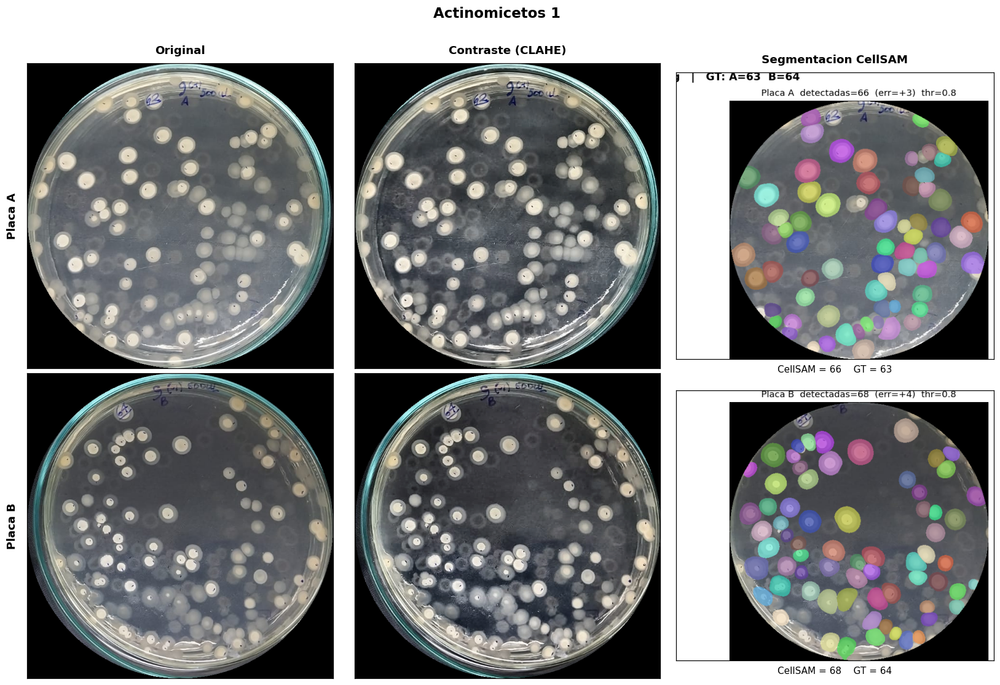

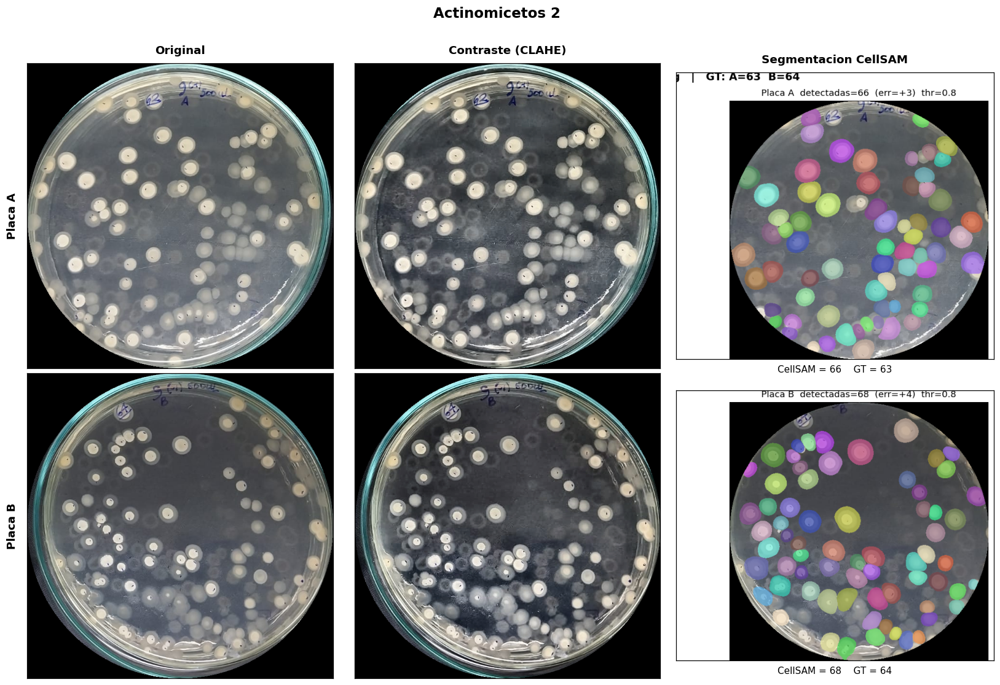

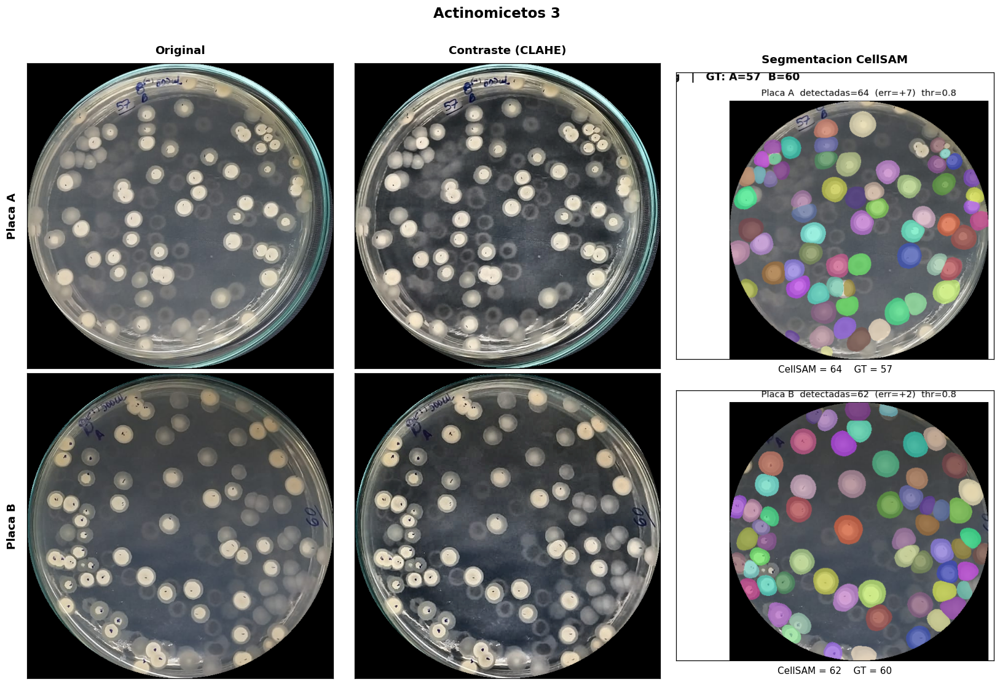

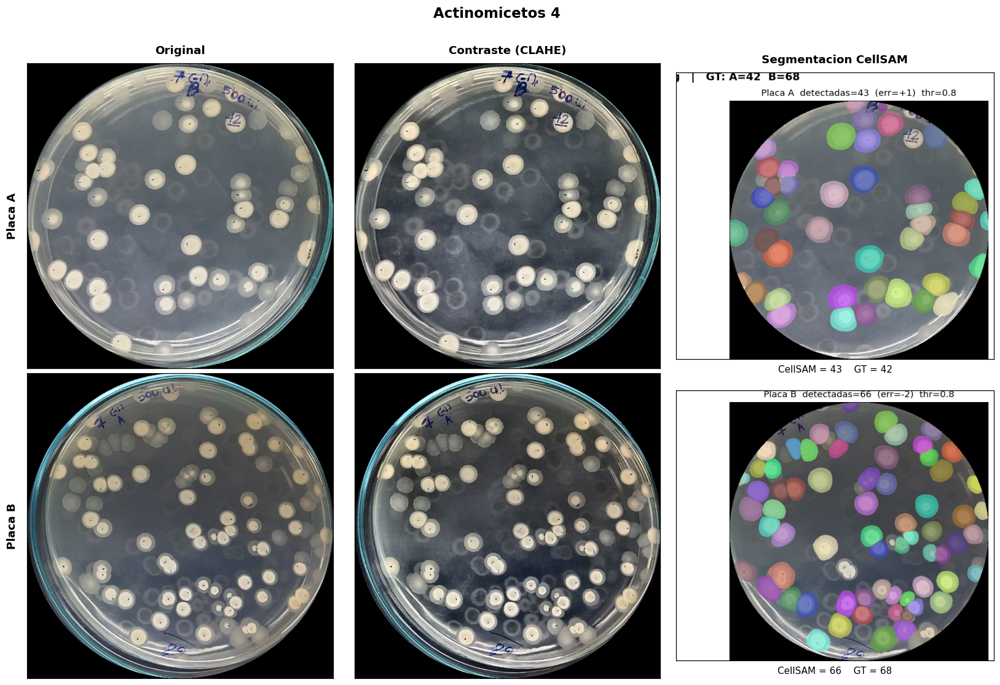

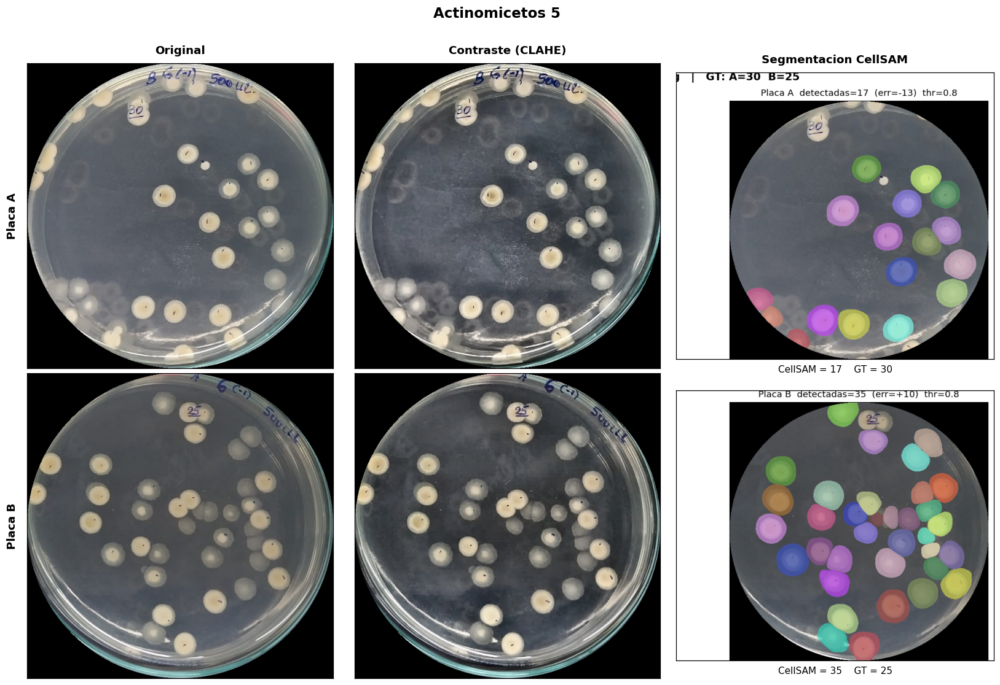

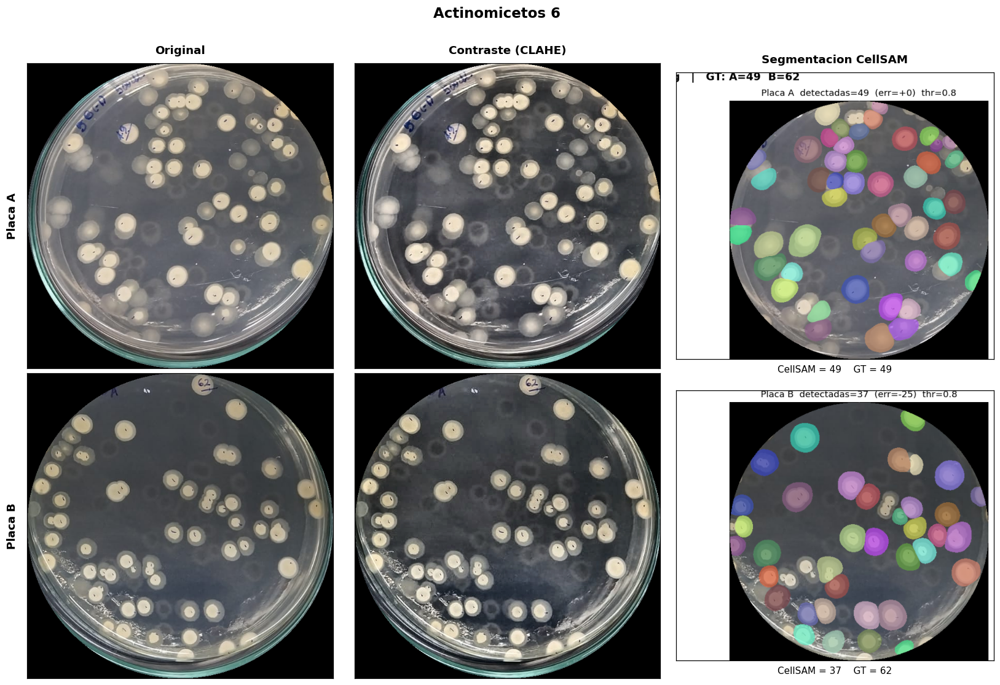

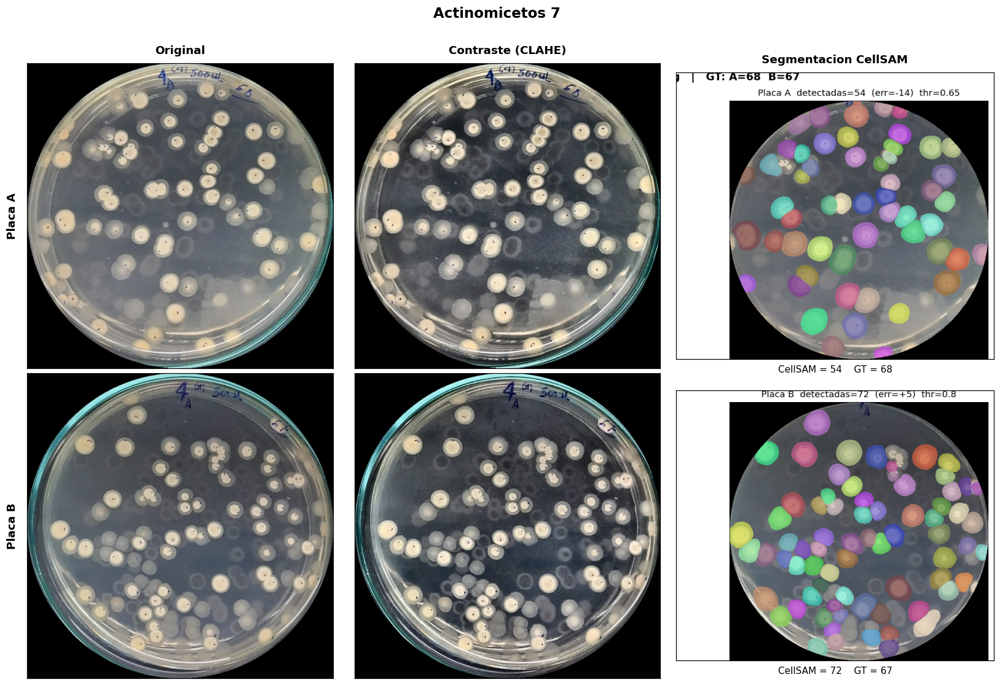

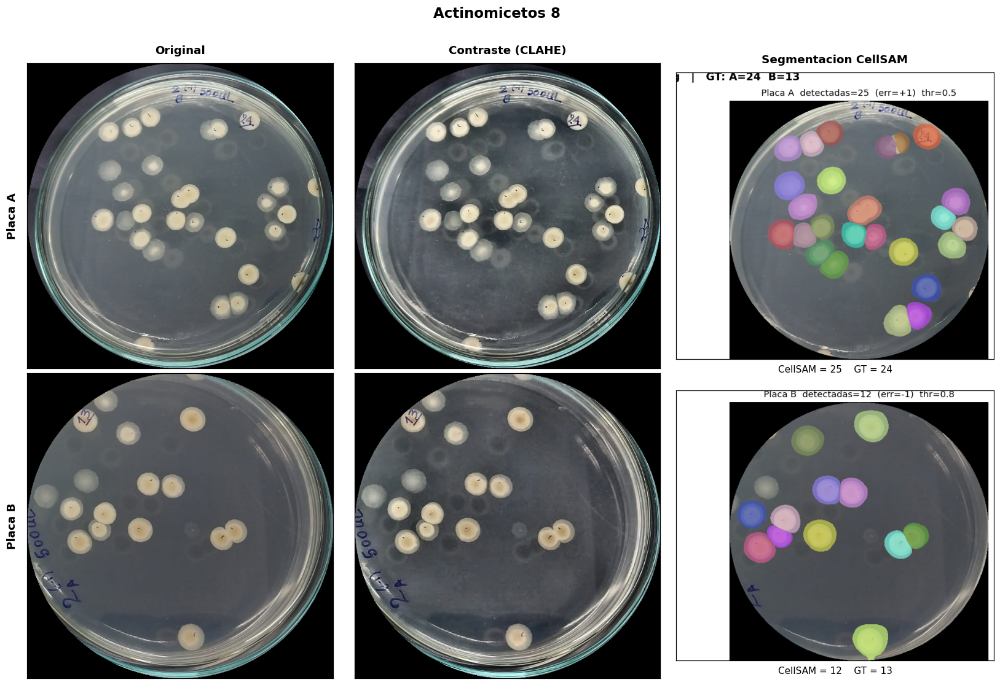

In [1]:
image_files = sorted(IMAGES_DIR.glob('actinomicetos_*.jpeg'))
results = []

for img_path in image_files:
    stem   = img_path.stem
    img    = cv2.imread(str(img_path))
    plates = detect_plates(img)
    panels = []
    counts = []

    for idx, (cx, cy, r) in enumerate(plates):
        placa_id    = 'AB'[idx]
        gt_val      = gt.get(stem, (None, None))[idx]
        crop, pmask = crop_plate(img, cx, cy, r, shrink=1.0)
        lmask, valid, thr = segment_cellsam(crop, pmask)
        n_col = len(valid)
        counts.append(n_col)

        original_rgb = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)
        original_rgb[pmask == 0] = 0
        clahe_rgb   = apply_clahe(crop, pmask)
        overlay_rgb = draw_instance_overlay(crop, valid, lmask, pmask)
        panels.append((original_rgb, clahe_rgb, overlay_rgb, placa_id, n_col, gt_val, thr))

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle(stem.replace('actinomicetos_', 'Actinomicetos '),
                 fontsize=15, fontweight='bold', y=1.01)
    for col, title in enumerate(['Original', 'Contraste (CLAHE)', 'Segmentacion CellSAM']):
        axes[0, col].set_title(title, fontsize=12, fontweight='bold', pad=10)
    for row, (orig, clahe, overlay, placa_id, n_col, gt_val, thr) in enumerate(panels):
        axes[row, 0].imshow(orig)
        axes[row, 1].imshow(clahe)
        axes[row, 2].imshow(overlay)
        axes[row, 0].set_ylabel(f'Placa {placa_id}', fontsize=12, fontweight='bold', labelpad=10)
        gt_str = f'GT={gt_val}' if gt_val is not None else ''
        axes[row, 2].set_xlabel(f'CellSAM={n_col}  thr={thr}  {gt_str}', fontsize=10, labelpad=6)
        for ax in axes[row]:
            ax.set_xticks([]); ax.set_yticks([])
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / f'{stem}_3panel.png', dpi=120, bbox_inches='tight')
    plt.show()

    results.append({'image': stem,
                    'cellsam_A': counts[0], 'cellsam_B': counts[1],
                    'gt_A': gt.get(stem, (None, None))[0],
                    'gt_B': gt.get(stem, (None, None))[1]})

print('Procesamiento completado.')


## 9. Tabla de comparacion: CellSAM vs Ground Truth

In [1]:
rows = []
for r in results:
    for placa in ['A', 'B']:
        gt_v = r[f'gt_{placa}']
        cs_v = r[f'cellsam_{placa}']
        err  = cs_v - gt_v if gt_v is not None else None
        rows.append({
            'Imagen':       r['image'].replace('actinomicetos_', ''),
            'Placa':        placa,
            'Ground Truth': gt_v,
            'CellSAM':      cs_v,
            'Error':        err,
            'Err abs':      abs(err) if err is not None else None,
        })

df = pd.DataFrame(rows)
display(df)

mae  = df['Err abs'].dropna().mean()
bias = df['Error'].dropna().mean()
print(f'\nError absoluto medio (MAE) : {mae:.1f} colonias/placa')
print(f'Sesgo medio (Bias)         : {bias:+.1f} colonias/placa')

Imagen Placa  Ground Truth  CellSAM  Error  Err abs
     1     A            63       66      3        3
     1     B            64       68      4        4
     2     A            63       66      3        3
     2     B            64       68      4        4
     3     A            57       64      7        7
     3     B            60       62      2        2
     4     A            42       43      1        1
     4     B            68       66     -2        2
     5     A            30       17    -13       13
     5     B            25       35     10       10
     6     A            49       49      0        0
     6     B            62       37    -25       25
     7     A            68       54    -14       14
     7     B            67       72      5        5
     8     A            24       25      1        1
     8     B            13       12     -1        1

Error absoluto medio (MAE) : 5.9 colonias/placa
Sesgo medio (Bias)         : -0.9 colonias/placa


## 10. Grafico de conteos: CellSAM vs Ground Truth

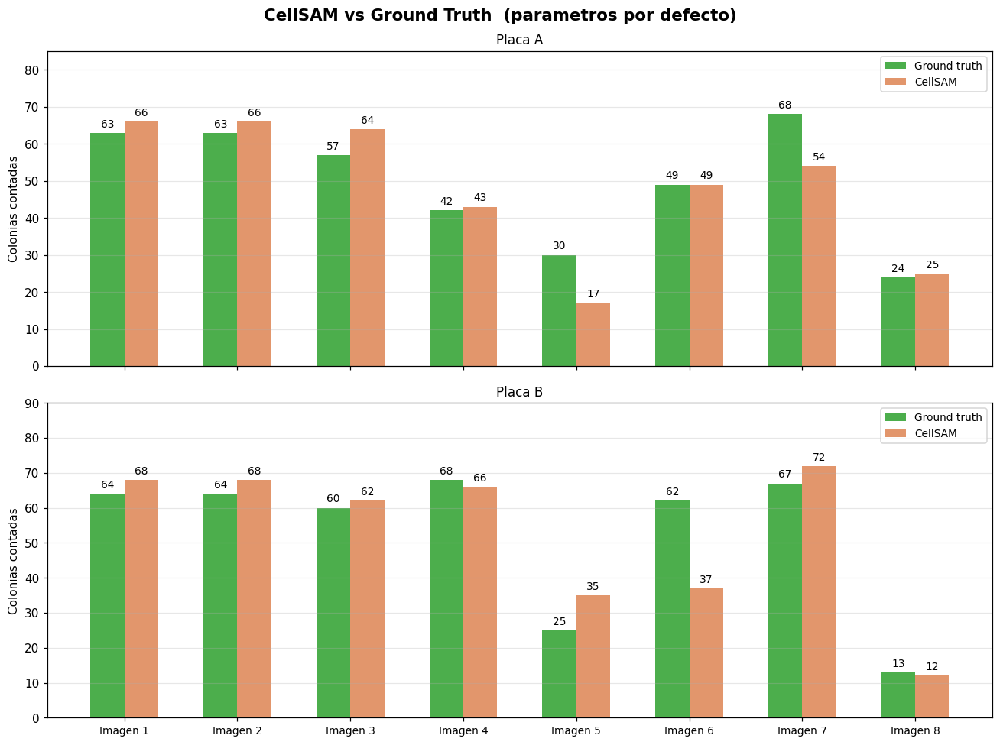

In [1]:
names = [r['image'].replace('actinomicetos_', '') for r in results]
x     = np.arange(len(results))
width = 0.30

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 9), sharex=True)
fig.suptitle('CellSAM vs Ground Truth  (parametros por defecto)', fontsize=14, fontweight='bold')

for ax, placa in [(ax1, 'A'), (ax2, 'B')]:
    gt_v = [r[f'gt_{placa}']      for r in results]
    cs_v = [r[f'cellsam_{placa}'] for r in results]
    b0 = ax.bar(x - width / 2, gt_v, width, label='Ground truth', color='#2ca02c', alpha=0.85)
    b1 = ax.bar(x + width / 2, cs_v, width, label='CellSAM',      color='#DD8452', alpha=0.85)
    ax.bar_label(b0, padding=3, fontsize=9)
    ax.bar_label(b1, padding=3, fontsize=9)
    ax.set_ylabel('Colonias contadas')
    ax.set_title(f'Placa {placa}', fontsize=11)
    ax.legend(fontsize=9)
    ax.set_ylim(0, max(gt_v + cs_v) * 1.25)
    ax.grid(axis='y', alpha=0.3)

ax2.set_xticks(x)
ax2.set_xticklabels([f'Imagen {n}' for n in names], fontsize=9)
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'comparacion_cellsam_gt.png', dpi=120, bbox_inches='tight')
plt.show()

## 11. Distribucion del error por placa

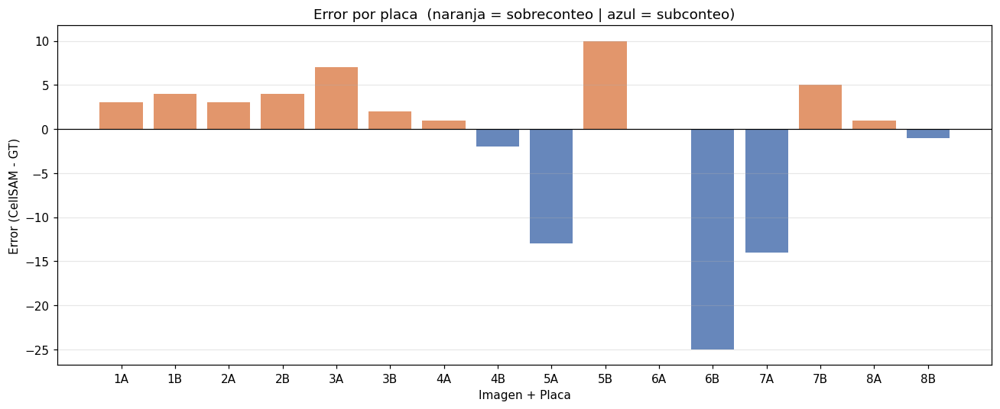

MAE  : 5.9 colonias/placa
Sesgo: -0.9 colonias/placa


In [1]:
labels      = []
errors      = []
color_bars  = []

for r in results:
    for placa in ['A', 'B']:
        gt_v = r[f'gt_{placa}']
        cs_v = r[f'cellsam_{placa}']
        if gt_v is not None:
            err = cs_v - gt_v
            labels.append(r['image'].replace('actinomicetos_', '') + placa)
            errors.append(err)
            color_bars.append('#DD8452' if err > 0 else '#4C72B0')

fig, ax = plt.subplots(figsize=(12, 5))
ax.bar(labels, errors, color=color_bars, alpha=0.85)
ax.axhline(0, color='black', linewidth=0.8)
ax.set_ylabel('Error (CellSAM - GT)')
ax.set_xlabel('Imagen + Placa')
ax.set_title('Error por placa  (naranja = sobreconteo | azul = subconteo)')
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'error_por_placa.png', dpi=120, bbox_inches='tight')
plt.show()

print(f'MAE  : {df["Err abs"].mean():.1f} colonias/placa')
print(f'Sesgo: {df["Error"].mean():+.1f} colonias/placa')

## 12. Guardar resultados en CSV

In [ ]:
df_out = pd.DataFrame(results)
df_out['err_A'] = df_out['cellsam_A'] - df_out['gt_A']
df_out['err_B'] = df_out['cellsam_B'] - df_out['gt_B']
out_csv = OUTPUT_DIR / 'cellsam_vs_gt.csv'
df_out.to_csv(out_csv, index=False)
print(f'Resultados guardados en {out_csv}')
display(df_out)